In [1]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [2]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torchvision.datasets as dsets
import torch.nn.functional as F
import numpy as np
from torch.autograd import Variable
from torch.optim.lr_scheduler import StepLR,MultiStepLR
import matplotlib.pyplot as plt
import math
from sklearn.utils import shuffle
from torch.utils.data import TensorDataset, DataLoader
from datetime import datetime
from sklearn.metrics import confusion_matrix
import scipy.io

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
# device =  torch.device("cpu")
print('device: ',device)

'''
STEP 3a_v2: CREATE Adaptative spike MODEL CLASS
'''
b_j0 = 0.1  # neural threshold baseline
tau_m = 20  # ms membrane potential constant
R_m = 1  # membrane resistance
dt = 1  #
gamma = .5  # gradient scale
lens = 0.5

surrograte_type = 'MG'
print('surrograte_type: ',surrograte_type)

neuron_type = 'adaptive'
print('neuron_type: ',neuron_type)

def gaussian(x, mu=0., sigma=.5):
    return torch.exp(-((x - mu) ** 2) / (2 * sigma ** 2)) / torch.sqrt(2 * torch.tensor(math.pi)) / sigma

# define approximate firing function

class ActFun_adp(torch.autograd.Function):
    @staticmethod
    def forward(ctx, input):  # input = membrane potential- threshold
        ctx.save_for_backward(input)
        return input.gt(0).float()  # is firing ???

    @staticmethod
    def backward(ctx, grad_output):  # approximate the gradients
        input, = ctx.saved_tensors
        grad_input = grad_output.clone()
        # temp = abs(input) < lens
        scale = 6.0
        hight = .15
        if surrograte_type == 'G':
            temp = torch.exp(-(input**2)/(2*lens**2))/torch.sqrt(2*torch.tensor(math.pi))/lens
        elif surrograte_type == 'MG':
            temp = gaussian(input, mu=0., sigma=lens) * (1. + hight) \
                - gaussian(input, mu=lens, sigma=scale * lens) * hight \
                - gaussian(input, mu=-lens, sigma=scale * lens) * hight
        elif surrograte_type =='linear':
            temp = F.relu(1-input.abs())
        elif surrograte_type == 'slayer':
            temp = torch.exp(-5*input.abs())
        return grad_input * temp.float() * gamma
# membrane potential update

act_fun_adp = ActFun_adp.apply

if neuron_type =='adaptive':
    def mem_update_adp(inputs, mem, spike, tau_m,tau_adp, b, isAdapt=1, dt=1):
        alpha = torch.exp(-1. * dt / tau_m).cuda()
        ro = torch.exp(-1. * dt / tau_adp).cuda()
        # tau_adp is tau_adaptative which is learnable # add requiregredients
        if isAdapt:
            beta = 1.8
        else:
            beta = 0.

        b = ro * b + (1 - ro) * spike
        B = b_j0 + beta * b

        mem = mem * alpha + (1 - alpha) * R_m * inputs - B * spike * dt
        inputs_ = mem - B
        spike = act_fun_adp(inputs_)  # act_fun : approximation firing function
        return mem, spike, B, b

if neuron_type  == 'LIF':
    def mem_update_adp(inputs, mem, spike, tau_m, tau_adp, b, dt=1, isAdapt=1):

        b = 0
        B = .5
        alpha = torch.exp(-1. * dt / tau_adp).cuda()
        mem = mem *.618 + inputs#*(1- alpha)
        inputs_ = mem - B
        spike = act_fun_adp(inputs_)  # act_fun : approximation firing function
        mem = (1-spike)*mem 
        return mem, spike, B, b

class RNN_s(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, sub_seq_length,criterion):
        super(RNN_s, self).__init__()
        self.criterion = criterion

        self.hidden_size = hidden_size
        self.output_size = output_size
        self.sub_seq_length = sub_seq_length
        self.i2h = nn.Linear(input_size, hidden_size)
        self.h2h = nn.Linear(hidden_size, hidden_size)
        self.h2o = nn.Linear(hidden_size, output_size)

        self.tau_adp_h = nn.Parameter(torch.Tensor(hidden_size))
        self.tau_adp_o = nn.Parameter(torch.Tensor(output_size))
        
        self.tau_m_h = nn.Parameter(torch.Tensor(hidden_size))
        self.tau_m_o = nn.Parameter(torch.Tensor(output_size))
        
        nn.init.orthogonal_(self.h2h.weight)
        nn.init.xavier_uniform_(self.i2h.weight)
        nn.init.xavier_uniform_(self.h2o.weight)
        nn.init.constant_(self.i2h.bias, 0)
        nn.init.constant_(self.h2h.bias, 0)
        nn.init.constant_(self.h2o.bias, 0)

        nn.init.constant_(self.tau_adp_h, 7) #7
        nn.init.constant_(self.tau_adp_o, 100)
        nn.init.constant_(self.tau_m_h, 20) #7
        nn.init.constant_(self.tau_m_o, 20)
        
        self.b_h = self.b_o = 0
        self.b_j0 = b_j0
        self.count = 0

    def forward(self, input,labels,backprop_steps=10,training=True,optimizer=None):
        total_spikes = 0
        batch_size, seq_num, input_dim = input.shape
        self.initial_neuron_states(batch_size)

        max_iters = 1301
        loss = 0
        loss_sum = 0

        output_ = []

        I_h = []
        predictions = []
        hid_mem_list = []
        hid_spike_list = []
        hid_b_list = []

        out_mem_list = []
        out_spike_list = []
        out_b_list = []


        for i in range(max_iters): # Go through the sequence
            if i < seq_num:
                input_x = input[:, i, :]
            else:
                input_x = torch.zeros(batch_size,input_dim)

            #################   update states  #########################
            h_input = self.i2h(input_x.float()) + self.h2h(self.hidden_spike)
            self.hidden_mem, self.hidden_spike, theta_h, self.b_h = mem_update_adp(h_input,self.hidden_mem, self.hidden_spike,self.tau_m_h,
                                                                            self.tau_adp_h, self.b_h,isAdapt=0)#0

            I_h.append(h_input.data.cpu().numpy())
            o_input = self.h2o(self.hidden_spike)
            self.output_mem, self.output_spike, theta_o, self.b_o = mem_update_adp(o_input,self.output_mem,self.output_spike,self.tau_m_o, 
                                                                         self.tau_adp_o, self.b_o,isAdapt=1)#, dt=input_dt_o)
            self.output_spike_sum[:,i,:] = self.output_spike
            avg_fr = float(self.hidden_spike.detach().mean() + self.output_spike.detach().mean())/2
            total_spikes = total_spikes + avg_fr

            hid_mem_list.append(self.hidden_mem.detach().cpu().numpy())
            hid_spike_list.append(self.hidden_spike.detach().cpu().numpy())
            hid_b_list.append(self.b_h.detach().cpu().numpy())
            out_mem_list.append(self.output_mem.detach().cpu().numpy())
            out_spike_list.append(self.output_spike.detach().cpu().numpy())
            out_b_list.append(self.b_o.detach().cpu().numpy())

            #################   classification  #########################
            if i >= self.sub_seq_length:
                output_sumspike = F.log_softmax(self.output_mem,dim=1)

                predictions.append(output_sumspike.data.cpu().numpy())
                output_.append(output_sumspike.data.cpu().numpy())
                loss += self.criterion(output_sumspike, labels[:, i])
                loss_sum+=loss
                loss =  loss + 0.2*avg_fr
                if training and i%backprop_steps==0:
                    loss.backward()
                    optimizer.step()
                    self.reset_neuron_states((self.hidden_mem.detach(),self.output_mem.detach()),
                                            (self.hidden_spike.detach(),self.output_spike.detach()),
                                            (self.b_h.detach(),self.b_o.detach()))
                                        
                    optimizer.zero_grad()
                    loss = 0

        predictions = torch.tensor(predictions)
        return predictions, loss_sum , total_spikes,(hid_mem_list,hid_spike_list,hid_b_list,out_mem_list,out_spike_list,out_b_list)

    def initial_neuron_states(self,batch_size):
        self.hidden_mem = self.hidden_spike = (torch.rand(batch_size, self.hidden_size)*b_j0).cuda()
        self.output_mem = self.output_spike = (torch.rand(batch_size, self.output_size)*b_j0).cuda()
        self.output_spike_sum = torch.zeros(batch_size,1301, self.output_size).cuda()
        self.b_h = self.b_o = self.b_j0
        self.count = 1

    def reset_neuron_states(self,saved_mem,saved_spike,saved_threshold):#,saved_tau_adp,saved_tau_m):
        self.hidden_mem,self.output_mem = saved_mem
        self.hidden_spike,self.output_spike = saved_spike
        self.b_h, self.b_o = saved_threshold

        

import scipy.signal as ssg
def convert_seq(x,threshold=0.03):
    l = len(x)
    x= ssg.savgol_filter(x, 5, 3)
    X = np.zeros((l,2))
    for i in range(len(x)-1):
        if x[i+1] - x[i] >= threshold:
            X[i,0] = 1
        elif x[i] - x[i+1] >= threshold:
            X[i,1] = 1
    return X


def expand_dim(x, N):
    y = np.zeros((x.shape[0], x.shape[1], N))
    for i in range(x.shape[0]):
        y[i, :, :] = np.tile(x[i,:], (N,1)).transpose()

    return y

def lbl_to_spike(prediction):
    N = len(prediction)
    detections = np.zeros(N)
    for i in range(1, N):
        if (prediction[i] != prediction[i-1]):
            detections[i] = prediction[i]+1
    return detections


def calculate_stats(prediction, lbl, tol):
    decisions = lbl_to_spike(prediction)
    labs = lbl_to_spike(lbl)

    lbl_indices = np.nonzero(labs)
    lbl_indices = np.array(lbl_indices).flatten()

    dist = np.zeros((len(lbl_indices), 6))
    for i in range(len(lbl_indices)):
        index = lbl_indices[i]
        lab = int(labs[index])
        dec_indices = np.array(np.nonzero((decisions-lab) == 0)).flatten()  #indices where decisions == lab
        if len(dec_indices) == 0:
            dist[i, lab - 1] = 250
            continue
        j = np.argmin(np.abs(dec_indices - index))  # j is closest val in dec_indices to index
        dist[i, lab-1] = abs(dec_indices[j]-index)
        if (dist[i, lab-1] <= tol):
            decisions[dec_indices[j]] = 0 # mark as handled

    mean_error = np.mean(dist, axis=0)
    TP = np.sum(dist <= tol, axis=0)
    FN = np.sum(dist > tol, axis=0)

    FP = np.zeros(6)
    for i in decisions[(decisions > 0)]:
        FP[int(i-1)] += 1

    return mean_error, TP, FN, FP

def convert_dataset_wtime(mat_data):
    X = mat_data["x"]
    Y = mat_data["y"]
    t = mat_data["t"]
    Y = np.argmax(Y[:, :, :], axis=-1)
    d1,d2 =  t.shape

    # dt = np.zeros((size(t[:, 1]), size(t[1, :])))
    dt = np.zeros((d1,d2))
    for trace in range(d1):
        dt[trace, 0] = 1
        dt[trace, 1:] = t[trace, 1:] - t[trace, :-1]

    return dt, X, Y


def load_max_i(mat_data):
    max_i = mat_data["max_i"]
    return np.array(max_i.squeeze(),dtype=np.float16)

device:  cuda:0
surrograte_type:  MG
neuron_type:  adaptive


In [3]:
train_mat = scipy.io.loadmat('QTDB_train.mat')
test_mat = scipy.io.loadmat('QTDB_test.mat')

# # old dataset
# xxt = np.load('dataset/test_y.npy')
# print(xxt.shape)
# xxt = np.load('dataset/xxt.npy')
# yyt = np.load('dataset/yyt.npy')
# xxv = np.load('dataset/xxv.npy')
# yyv = np.load('dataset/yyv.npy')

train_dt, train_x, train_y = convert_dataset_wtime(train_mat)
train_max_i = load_max_i(train_mat)
test_dt, test_x, test_y = convert_dataset_wtime(test_mat)
test_max_i = load_max_i(test_mat)

nb_of_sample, seq_dim, input_dim = np.shape(train_x)
print('sequence length: {} , input dimension: {}'.format(seq_dim, input_dim))
print('training dataset distribution: ',train_y.shape)
print('test dataset distribution: ',test_y.shape)

# STEP 2: MAKING DATASET ITERABLE
batch_size = 64
n_iters = 300000
lens = 0.5  # hyper-parameters of approximate function
#num_epochs = 1#250  # n_iters / (len(train_dataset) / batch_size)
num_epochs =0
#nb_of_batch = nb_of_sample // batch_size

sub_seq_length = 10
#L = seq_dim - sub_seq_length
hidden_dim = 36
if neuron_type =='LIF': hidden_dim = 36
output_dim = 6

train_data = TensorDataset(torch.from_numpy(train_x*1.),torch.from_numpy(train_y))
train_loader = DataLoader(train_data, shuffle=True, batch_size=batch_size, drop_last=False)
test_data = TensorDataset(torch.from_numpy(test_x*1.),torch.from_numpy(test_y))
test_loader = DataLoader(test_data, shuffle=True, batch_size=batch_size, drop_last=False)

criterion = nn.NLLLoss()#nn.CrossEntropyLoss()
model = RNN_s(input_size=input_dim, hidden_size=hidden_dim,
                output_size=output_dim, sub_seq_length=sub_seq_length,criterion=criterion)
# model.load_state_dict(torch.load('model_0.8567277--bptt50_36_MG.pth'))
model.load_state_dict(torch.load('model_0.8589141409979619_36tbptt-fr_MG.pth'))
model.to(device)

learning_rate =1e-2#1e-2

base_params = [model.i2h.weight, model.i2h.bias, model.h2h.weight,
                model.h2h.bias, model.h2o.weight, model.h2o.bias]

optimizer = torch.optim.Adam([
    {'params': base_params},
    {'params': model.tau_m_h, 'lr': learning_rate * 3},
    {'params': model.tau_m_o, 'lr': learning_rate * 2},
    {'params': model.tau_adp_h, 'lr': learning_rate * 3},
    {'params': model.tau_adp_o, 'lr': learning_rate * 2}, ],
    lr=learning_rate)
# scheduler = StepLR(optimizer, step_size=100, gamma=.75) # gaussian
scheduler = StepLR(optimizer, step_size=50, gamma=.5) # LIF

# training network
dims = {
    "samples": seq_dim,
    "input": input_dim,
    "hidden": hidden_dim,
    "output": output_dim,
    "sub_seq": sub_seq_length
}
# with sechdual
# train_acc_list = train(model,dims, train_loader,optimizer,scheduler,num_epochs=num_epochs)
test_seq_dim = test_x.shape[1]




sequence length: 1301 , input dimension: 4
training dataset distribution:  (618, 1301)
test dataset distribution:  (141, 1301)


In [4]:
i = 10
x_emp = test_x#[i:i+20]
y_emp = test_y#[i:i+20]

images = torch.tensor(x_emp*1.).view((-1, test_seq_dim, input_dim)).requires_grad_().to(device)
labels = torch.tensor(y_emp).view((-1, test_seq_dim)).long().to(device)

pred,_,spike,states=  model.forward(images,labels,training=False) #model.predict(images,labels)
hid_mem_list,hid_spike_list,hid_b_list,out_mem_list,out_spike_list,out_b_list = states


In [5]:
hid_mem_npy = np.array(hid_mem_list)
hid_spike_npy = np.array(hid_spike_list)
hid_b_npy = np.array(hid_b_list)
out_mem_npy = np.array(out_mem_list)
out_spike_npy = np.array(out_spike_list)
out_b_npy = np.array(out_b_list)


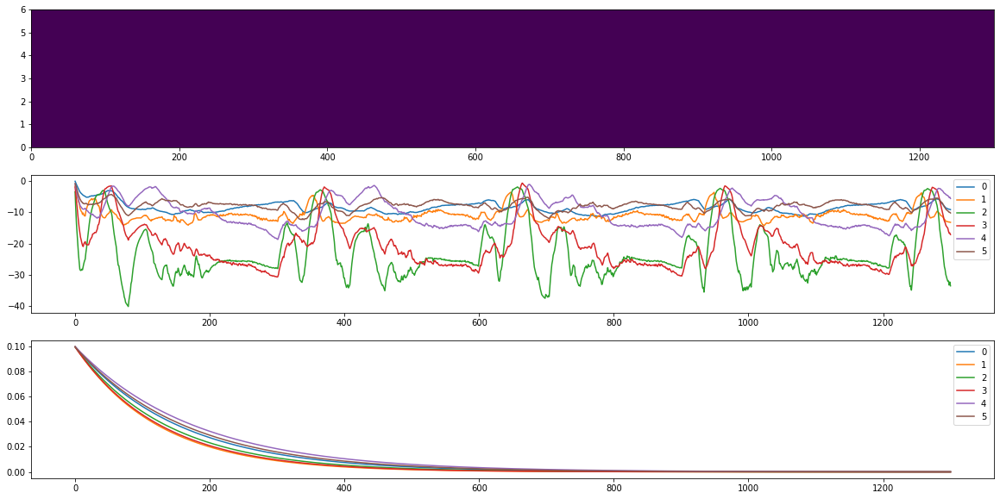

In [6]:
plt.figure(figsize=(20,10))
plt.subplot(311)
plt.pcolor(out_spike_npy[:,9,:].T)
plt.subplot(312)
for i in range(6):
    plt.plot(out_mem_npy[:,9,i],label=str(i))
plt.legend()

plt.subplot(313)
for i in range(6):
    plt.plot(out_b_npy[:,9,i],label=str(i))
plt.legend()

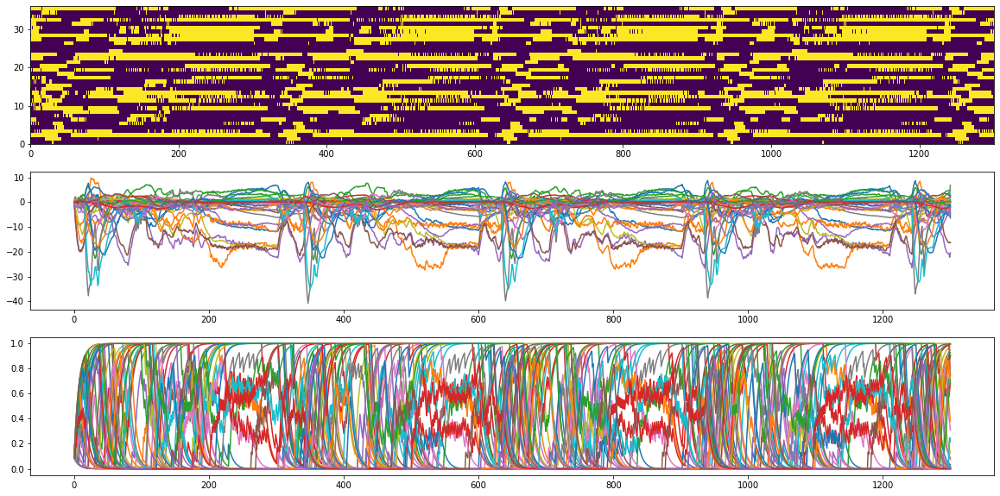

In [7]:
plt.figure(figsize=(20,10))
plt.subplot(311)
plt.pcolor(hid_spike_npy[:,9,:].T)
plt.subplot(312)
for i in range(36):
    plt.plot(hid_mem_npy[:,9,i],label=str(i))
# plt.legend()

plt.subplot(313)
for i in range(36):
    plt.plot(hid_b_npy[:,9,i],label=str(i))
# plt.legend()

Text(0, 0.5, 'Neuron')

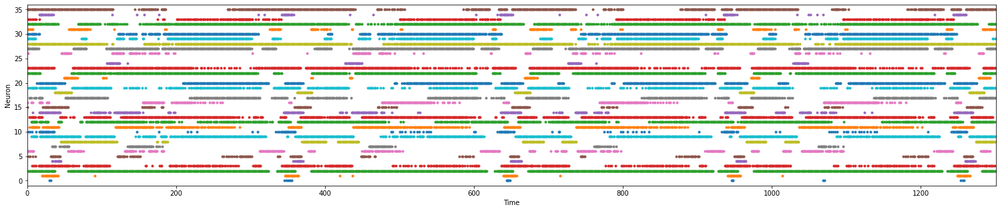

In [55]:
exp_spike = hid_spike_npy[:,9,:].T
plt.figure(figsize=(26,5))
for i in range(36):
    s_idx = np.where(exp_spike[i,:]>0)[0]
    l = len(s_idx)
    plt.plot(s_idx,np.ones(l)*i,'.')
plt.xlim(0,1301)
plt.ylim(-1,36)
plt.xlabel('Time')
plt.ylabel('Neuron')
# plt.imshow(exp_spike)
# np.where(exp_spike[1,:]>0)

In [28]:
hid_spike_npy.shape,out_spike_npy.shape

((1301, 141, 36), (1301, 141, 6))

In [31]:
all_spike_npy = np.zeros((1301,141,42))
all_spike_npy[:,:,:36] = hid_spike_npy
all_spike_npy[:,:,36:] = out_spike_npy
all_spike_npy.shape

(1301, 141, 42)

In [32]:
np.mean(hid_spike_npy),np.mean(out_spike_npy)

(0.34435263, 0.0038350206)

In [37]:
total_hid_spike = all_spike_npy.mean(axis=(0,2))
total_hid_spike.shape

(141,)

In [38]:
np.mean(total_hid_spike),np.var(total_hid_spike),np.min(total_hid_spike),np.max(total_hid_spike)

(0.2957072482887323,
 0.0002644704884555236,
 0.2513451191391238,
 0.33532813586618354)